# 1. Librerías a implementar

In [1]:
#Librería para comando de sistema
import os

#Librerías para manejo de datos
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

#Librerías de machine learning
#Para realizar la separación del conjunto de aprendizaje en entrenamiento y test
from sklearn.model_selection import train_test_split
#Librería para parámetros polinomiales
from sklearn.preprocessing import PolynomialFeatures
#Para construir un modelo con el algoritmo de regresión lineal
from sklearn.linear_model import LinearRegression
#Para determinar el rendimiento del modelo con las métricas MSE, MAE y R2
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

#Para sacar un reporte estadístico que podemos usar para determinar la importancia de las variables explicativas
import statsmodels.api as sm

# 2. Carga de los datos

In [2]:
#Se cargan los datos
df = pd.read_csv('IBM_CustomerLoyaltyProgram.csv', sep=',')

In [3]:
#Mostrar datos
df.head()

,Loyalty#,First Name,Last Name,Customer Name,Country,Province or State,StateAbbr,City,Latitude,Longitude,...,LoyaltyStatus,Product Line,Coupon Response,Count,Quantity Sold,Unit Sale Price,Unit Cost,Revenue,Customer Lifetime Value,Loyalty Count
0,689112.0,Aaron,Macayan,Aaron Macayan,Canada,Ontario,ON,Toronto,43.653226,-79.383184,...,Bronze,Computers and Home Office,Coupon 1,1.0,1.0,$594.00,$504.90,$594.00,2895.52,1.0
1,991054.0,Abbey,Boettger,Abbey Boettger,United Kingdom,Greater London,JS,London,51.507351,-0.127758,...,Bronze,Computers and Home Office,Coupon 1,1.0,2.0,$361.00,$306.85,$722.00,11546.17,1.0
2,845894.0,Abbie,Privitera,Abbie Privitera,Germany,Hessen,HE,Frankfurt,50.110922,8.682127,...,Silver,Smart Electronics,Coupon 1,1.0,7.0,$109.00,$92.65,$763.00,5837.53,1.0
3,312490.0,Adah,Demmert,Adah Demmert,Canada,Quebec,QC,Montreal,45.501689,-73.567256,...,VIP,TV and Video Gaming,Coupon 1,1.0,2.0,"$1,106.00",$940.10,"$2,212.00",7319.58,1.0
4,500884.0,Adaline,Jaenke,Adaline Jaenke,United Kingdom,Brighton and Hove,JI,Bear Road,50.837645,-0.122104,...,Bronze,Computers and Home Office,Coupon 6,1.0,2.0,"$1,066.00",$906.10,"$2,132.00",14166.20,1.0


In [4]:
#Cantidad de datos y número de variables
df.shape

(84451, 29)

# 3. Preparación de los datos
Antes de realizar cualquier paso de preparación es necesario asegurar de limpiar los dato como aquellos faltantes y los registros duplicados.

In [5]:
#Es recomendable que todos los pasos de preparación se realicen en otro dataframe
df_t = df

In [6]:
#Se visualiza los registros nulos a continuación:
df_t.isna().sum()/len(df_t)

Loyalty#                   0.000071
First Name                 0.000071
Last Name                  0.000071
Customer Name              0.000071
Country                    0.000071
Province or State          0.000071
StateAbbr                  0.000071
City                       0.000071
Latitude                   0.000178
Longitude                  0.000178
Postal code                0.000071
Gender                     0.000071
Education                  0.000071
Location Code              0.000071
Income                     0.000071
Marital Status             0.000071
Order Year                 0.000071
Quarter                    0.000071
MonthsAsMember             0.000071
LoyaltyStatus              0.000071
Product Line               0.000071
Coupon Response            0.000071
Count                      0.000071
Quantity Sold              0.000071
Unit Sale Price            0.000071
Unit Cost                  0.000071
Revenue                    0.000071
Customer Lifetime Value    0

In [7]:
#Se explora el dataframe para saber si hay registros nulos y se eliminan
df_t = df_t.dropna()
#Se explora el dataframe para saber si hay registros duplicados y se eliminan
df_t = df_t.drop_duplicates()

In [8]:
#Se observa el tamaño del df para comprobar si se eliminaro registros duplicados
df_t.shape

(71179, 29)

In [9]:
#Se visualiza los registros nulos a continuación:
df_t.isna().sum()/len(df_t)

Loyalty#                   0.0
First Name                 0.0
Last Name                  0.0
Customer Name              0.0
Country                    0.0
Province or State          0.0
StateAbbr                  0.0
City                       0.0
Latitude                   0.0
Longitude                  0.0
Postal code                0.0
Gender                     0.0
Education                  0.0
Location Code              0.0
Income                     0.0
Marital Status             0.0
Order Year                 0.0
Quarter                    0.0
MonthsAsMember             0.0
LoyaltyStatus              0.0
Product Line               0.0
Coupon Response            0.0
Count                      0.0
Quantity Sold              0.0
Unit Sale Price            0.0
Unit Cost                  0.0
Revenue                    0.0
Customer Lifetime Value    0.0
Loyalty Count              0.0
dtype: float64

# 4. Análisis descriptivo
Se realiza un análisis de acuerdo a la información presente en el set de datos con ayuda de gráficas.

## Análisis Tipo Cupón

In [10]:
#Se implementa set_option() para observar todas las filas
pd.set_option("display.max_rows", 6)

#Se hace el conteo por cada una de las regiones y se ordena de mayor a menor
tabla_cupon = df_t['Coupon Response'].value_counts().reset_index()

In [11]:
#Se crea un dataframe y se cambia el nombre de las columnas
cupon = pd.DataFrame(tabla_cupon)
cupon.columns = ['Tipo Cupon', 'Cantidad']
cupon

,Tipo Cupon,Cantidad
0,Coupon 1,35938
1,Coupon 2,14687
2,Coupon 4,14041
3,Coupon 6,3766
4,Coupon 3,1460
5,Coupon 5,1287


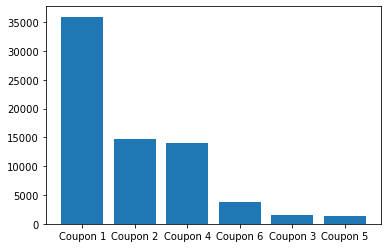

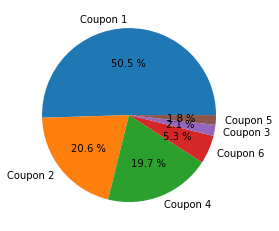

In [12]:
#Se crean dos columnas en forma de lista para su posterior graficación
columna_x = cupon['Tipo Cupon'].tolist()
columna_y = cupon['Cantidad'].tolist()

#Se crea un gráfico de barras
plt.bar(columna_x, columna_y)
plt.show()

#Se crea un gráfico pie o torta
plt.pie(columna_y, labels=columna_x, autopct="%0.1f %%")
plt.show()

## Análisis País

In [13]:
#Se implementa set_option() para observar todas las filas
pd.set_option("display.max_rows", 6)

#Se hace el conteo por cada una de las regiones y se ordena de mayor a menor
tabla_pais = df_t['Country'].value_counts().reset_index()

In [14]:
#Se crea un dataframe y se cambia el nombre de las columnas
pais = pd.DataFrame(tabla_pais)
pais.columns = ['País', 'Cantidad']
pais

,País,Cantidad
0,United States,18614
1,Canada,18307
2,United Kingdom,17591
3,Germany,16667


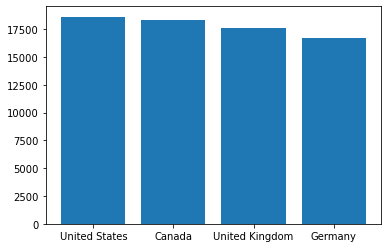

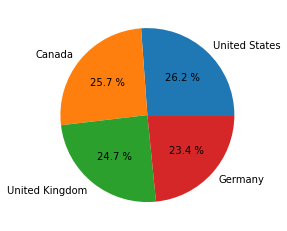

In [15]:
#Se crean dos columnas en forma de lista para su posterior graficación
columna_x = pais['País'].tolist()
columna_y = pais['Cantidad'].tolist()

#Se crea un gráfico de barras
plt.bar(columna_x, columna_y)
plt.show()

#Se crea un gráfico pie o torta
plt.pie(columna_y, labels=columna_x, autopct="%0.1f %%")
plt.show()

## Análisis tipo de afiliación/membresía

In [16]:
#Se implementa set_option() para observar todas las filas
pd.set_option("display.max_rows", 6)

#Se hace el conteo por cada una de las regiones y se ordena de mayor a menor
tabla_LoyaltyStatus = df_t['LoyaltyStatus'].value_counts().reset_index()

In [17]:
#Se crea un dataframe y se cambia el nombre de las columnas
loyaltyStatus = pd.DataFrame(tabla_LoyaltyStatus)
loyaltyStatus.columns = ['LoyaltyStatus', 'Cantidad']
loyaltyStatus

,LoyaltyStatus,Cantidad
0,Platinum,12185
1,Gold,12091
2,Bronze,12084
3,Silver,11822
4,Elite,11628
5,VIP,11369


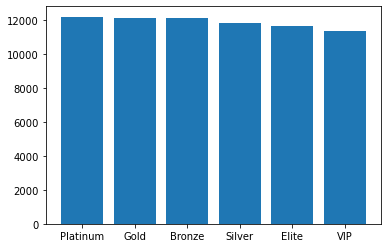

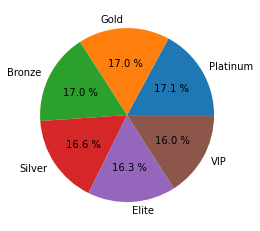

In [18]:
#Se crean dos columnas en forma de lista para su posterior graficación
columna_x = loyaltyStatus['LoyaltyStatus'].tolist()
columna_y = loyaltyStatus['Cantidad'].tolist()

#Se crea un gráfico de barras
plt.bar(columna_x, columna_y)
plt.show()

#Se crea un gráfico pie o torta
plt.pie(columna_y, labels=columna_x, autopct="%0.1f %%")
plt.show()

## Análisis Tipo de Afiliación/Membresía - Tipo Cupón

In [19]:
#Se implementa set_option() para observar todas las filas
pd.set_option("display.max_rows", 36)

#Se hace el conteo por cada una de las regiones y se ordena de mayor a menor
tabla_loyaltyStatus_cupon = df_t[['LoyaltyStatus', 'Coupon Response']].value_counts().reset_index()

In [20]:
#Se crea un dataframe y se cambia el nombre de las columnas
loyaltyStatus_cupon = pd.DataFrame(tabla_loyaltyStatus_cupon)
loyaltyStatus_cupon.columns = ['Tipo Membresía', 'Tipo Cupon', 'Cantidad']
loyaltyStatus_cupon

,Tipo Membresía,Tipo Cupon,Cantidad
0,Platinum,Coupon 1,6179
1,Bronze,Coupon 1,6152
2,Gold,Coupon 1,6136
3,Silver,Coupon 1,5962
4,Elite,Coupon 1,5844
5,VIP,Coupon 1,5665
6,Platinum,Coupon 2,2529
7,Bronze,Coupon 2,2503
8,Gold,Coupon 2,2494
9,Silver,Coupon 2,2429


## Análisis Tipo Cupón - Linea de producto

In [21]:
#Se implementa set_option() para observar todas las filas
pd.set_option("display.max_rows", 30)

#Se hace el conteo por cada una de las regiones y se ordena de mayor a menor
tabla_cupon_producto = df_t[['Coupon Response', 'Product Line']].value_counts().reset_index()

In [22]:
#Se crea un dataframe y se cambia el nombre de las columnas
cupon_producto = pd.DataFrame(tabla_cupon_producto)
cupon_producto.columns = ['Tipo Cupón', 'Linea Producto', 'Cantidad']
cupon_producto

,Tipo Cupón,Linea Producto,Cantidad
0,Coupon 1,TV and Video Gaming,14377
1,Coupon 1,Computers and Home Office,8455
2,Coupon 1,Photography,6386
3,Coupon 2,TV and Video Gaming,5850
4,Coupon 4,TV and Video Gaming,5674
5,Coupon 1,Smart Electronics,3539
6,Coupon 2,Computers and Home Office,3432
7,Coupon 4,Computers and Home Office,3216
8,Coupon 1,Kitchen Appliances,3181
9,Coupon 2,Photography,2568


## Análisis Ciudad-Tipo Cupón

In [23]:
#Se implementa set_option() para observar todas las filas
pd.set_option("display.max_rows", 649)

#Se hace el conteo por cada una de las regiones y se ordena de mayor a menor
tabla_ciudad_cupon = df_t[['City','Coupon Response']].value_counts().reset_index()

In [24]:
#Se crea un dataframe y se cambia el nombre de las columnas
ciudad_cupon = pd.DataFrame(tabla_ciudad_cupon)
ciudad_cupon.columns = ['Ciudad', 'Tipo Cupon', 'Cantidad']
ciudad_cupon

,Ciudad,Tipo Cupon,Cantidad
0,London,Coupon 1,2745
1,Birmingham,Coupon 1,1955
2,Toronto,Coupon 1,1860
3,Los Angeles,Coupon 1,1436
4,Vancouver,Coupon 1,1375
5,Miami,Coupon 1,1367
6,Montreal,Coupon 1,1089
7,London,Coupon 2,1083
8,Frankfurt,Coupon 1,1076
9,London,Coupon 4,1067


## Análisis Género - Tipo Cupón - Estado Civil

In [25]:
#Se implementa set_option() para observar todas las filas
pd.set_option("display.max_rows", 36)

#Se hace el conteo por cada una de las regiones y se ordena de mayor a menor
tabla_genero_cupon = df_t[['Gender','Coupon Response', 'Marital Status']].value_counts().reset_index()

In [26]:
#Se crea un dataframe y se cambia el nombre de las columnas
genero_cupon = pd.DataFrame(tabla_genero_cupon)
genero_cupon.columns = ['Género', 'Tipo Cupon', 'Estado Civil', 'Cantidad']
genero_cupon

,Género,Tipo Cupon,Estado Civil,Cantidad
0,male,Coupon 1,Married,10273
1,female,Coupon 1,Married,10195
2,female,Coupon 1,Single,4852
3,male,Coupon 1,Single,4809
4,female,Coupon 2,Married,4435
5,male,Coupon 4,Married,4300
6,male,Coupon 2,Married,4293
7,female,Coupon 4,Married,4201
8,male,Coupon 1,Divorced,2966
9,female,Coupon 1,Divorced,2843


## Análisis persona - Línea de producto

In [27]:
#Se implementa set_option() para observar todas las filas
pd.set_option("display.max_rows", 65529)

#Se hace el conteo por cada una de las regiones y se ordena de mayor a menor
tabla_persona_producto = df_t[['Customer Name','Product Line']].value_counts().reset_index()

In [28]:
#Se crea un dataframe y se cambia el nombre de las columnas
persona_producto = pd.DataFrame(tabla_persona_producto)
persona_producto.columns = ['Nombre Cliente', 'Linea producto', 'Cantidad']
persona_producto

,Nombre Cliente,Linea producto,Cantidad
0,Paris Ruesink,Kitchen Appliances,3
1,Jillian Rencher,Kitchen Appliances,3
2,Tora Fackrell,TV and Video Gaming,3
3,Jimmie Servantes,TV and Video Gaming,3
4,Danyelle Scaringe,Computers and Home Office,3
5,Libby Stubby,TV and Video Gaming,3
6,Fern Ovesen,Smart Electronics,3
7,Aubrey Leskovac,Smart Electronics,3
8,Tony Ursua,TV and Video Gaming,3
9,Tony Toan,TV and Video Gaming,3


# 5. Construcción del modelo - Regresión Lineal
Los algoritmos supervisados en Sckit-learn requieren que las variables de entrada estén separadas de la variable objeto. En este caso, la variable objeto es el precio

In [ ]:
# precio = df_t['Unit Sale Price'].replace('[^\d.]', '', regex=True).astype(float)

In [29]:
#Se filtra el dataframe para tener solo variables con valores cuantitativos
df_dropped = df_t[['Income', 'MonthsAsMember', 'Unit Sale Price', 'Revenue', 'Customer Lifetime Value']]
df_dropped[['Income', 'MonthsAsMember', 'Unit Sale Price', 'Revenue', 'Customer Lifetime Value']] = df_dropped[['Income', 'MonthsAsMember', 'Unit Sale Price', 'Revenue', 'Customer Lifetime Value']].replace('[^\d.]', '', regex=True).astype(float)
df_dropped.head()

C:\Users\felip\anaconda3\lib\site-packages\pandas\core\frame.py:3641: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


,Income,MonthsAsMember,Unit Sale Price,Revenue,Customer Lifetime Value
0,46267.0,56.0,594.0,594.0,2895.52
1,81081.0,53.0,361.0,722.0,11546.17
2,83308.0,59.0,109.0,763.0,5837.53
3,57777.0,62.0,1106.0,2212.0,7319.58
4,67588.0,66.0,1066.0,2132.0,14166.20


In [30]:
#Se selecciona la variable objetivo, en este caso "Unit Sale Price"
Y = df_dropped['Unit Sale Price']

#Del conjunto de datos se elimina la variable Unit Sale Price"
X = df_dropped.drop(['Unit Sale Price'], axis=1)

In [31]:
#Se muestran los datos de Y
Y.head()

0     594.0
1     361.0
2     109.0
3    1106.0
4    1066.0
Name: Unit Sale Price, dtype: float64

In [32]:
#Se muestran los datos de X
X.head()

,Income,MonthsAsMember,Revenue,Customer Lifetime Value
0,46267.0,56.0,594.0,2895.52
1,81081.0,53.0,722.0,11546.17
2,83308.0,59.0,763.0,5837.53
3,57777.0,62.0,2212.0,7319.58
4,67588.0,66.0,2132.0,14166.20


Ahora, es necesario hacer la separación de los datos en un conjunto de entrenamiento y otro para realizar la prueba o test. Es así como esta división permite determinar el rendimiento de generalización del modelo sobre nuevos datos.

El conjunto de entranmiento se usa para ajustar (entrenar) un modelo. Posteriormente, se usa el conjunto de test para hacer predicciones, las cuales se comparan con los valores esperados para determinar su rendimiento usando la métrica seleccionada.

1. **Train data:** Se utiliza para entrenar el modelo con el algoritmo de aprendizaje
2. **Test data:** Se utiliza para evaluar el ajusto del modelo

In [33]:
#Se realiza la divisón entrenamiento - test. Se deja el 20% de los datos para el test
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2 , random_state=0)

Antes de construir el modelo debemos crear un objeto de la clase **LinearRegression**.

In [34]:
#Primero se crea el objeto para construir el modelo
modelo_regresion = LinearRegression()
#Se comprueba que el modelo fue construido
modelo_regresion

LinearRegression()

In [35]:
#Ajustar el modelo con los datos de entrenamiento
modelo_regresion.fit(X_train, Y_train)

LinearRegression()

# 6. Evaluación del modelo
Las métricas de evaluación permitirán determinar qué tan bien se desempeña un modelo, es decir, cómo se ajusta a los datos. En esta sección se utilizan las siguientes métricas:

1. Mean-Squared-Error(MSE). Error medio cuadrático
2. Mean-Absolute-Error(MAE). Error absoluto medio
3. R² o Coeficiente de determinación

In [36]:
#Se obtienen las predicciones del modelo sobre el conjunto de entrenamiento
y_pred = modelo_regresion.predict(X_train)
#Se obtienen las métricas a partir de la predicción y la base de evaluación (valores reales)
print("MSE: %.2f" % mean_squared_error(Y_train, y_pred, squared=True))
print("RMSE: %.2f" % mean_squared_error(Y_train, y_pred, squared=False))
print("MAE: %.2f" % mean_absolute_error(Y_train, y_pred))
print("R²: %.2f" % r2_score(Y_train, y_pred))

MSE: 112676.23
RMSE: 335.67
MAE: 275.17
R²: 0.13


In [37]:
#Se obtienen las predicciones del modelo sobre el conjuno test.
y_pred = modelo_regresion.predict(X_test)
#Se obtienen las métricas a partir de la predicción y la base de evaluación (valores reales)
print("MSE: %.2f" % mean_squared_error(Y_test, y_pred, squared=True))
print("RMSE: %.2f" % mean_squared_error(Y_test, y_pred, squared=False))
print("MAE: %.2f" % mean_absolute_error(Y_test, y_pred))
print("R²: %.2f" % r2_score(Y_test, y_pred))

MSE: 115750.34
RMSE: 340.22
MAE: 278.86
R²: 0.13


Una vez determinado el rendimiento de generalización usando el conjunto test se puede tomar los datos y construir el modelo final.

In [38]:
#Ajustar el modelo con todos los datos
modelo_regresion.fit(X,Y)

LinearRegression()

In [39]:
#Podemos visualizar los parámetros del modelo (coeficientes de regresión)
modelo_regresion.coef_

array([-6.12028485e-05, -2.32213344e-01,  2.29252085e-02, -1.80511714e-04])

In [40]:
#Para visualizar el intercepto, se usa el atributo intercept_ del modelo
modelo_regresion.intercept_

511.34078658460584

# 7. Interpretación del modelo
También podemos sacar un reporte que nos va a permitir analizar estadísticos del modelo

In [41]:
#Ajustar el modelo para ver el reporte
model = sm.OLS(Y,X).fit() ## sm.OLS(output, input)
#Mostrar los estadísticos del modelo
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:        Unit Sale Price   R-squared (uncentered):                   0.722
Model:                            OLS   Adj. R-squared (uncentered):              0.722
Method:                 Least Squares   F-statistic:                          4.628e+04
Date:                Tue, 02 Aug 2022   Prob (F-statistic):                        0.00
Time:                        18:07:16   Log-Likelihood:                     -5.1837e+05
No. Observations:               71179   AIC:                                  1.037e+06
Df Residuals:                   71175   BIC:                                  1.037e+06
Df Model:                           4                                                  
Covariance Type:            nonrobust                                                  
===========================================================================================
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Income                      0.0008   4.21e-05     18.328      0.000       0.001       0.001
MonthsAsMember              8.1640      0.048    170.652      0.000       8.070       8.258
Revenue                     0.0248      0.000    106.845      0.000       0.024       0.025
Customer Lifetime Value     0.0031      0.000     16.910      0.000       0.003       0.004
==============================================================================
Omnibus:                     4339.201   Durbin-Watson:                   1.950
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            19166.456
Skew:                           0.090   Prob(JB):                         0.00
Kurtosis:                       5.536   Cond. No.                     1.77e+03
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[3] The condition number is large, 1.77e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Cuando la **coef** es positivo, esto quiere decir que a medida que se aumente esta variable, también aumentará el valor de la variable objetivo. Si el valor de **coef** fuera negativo, esto significaría que a medida que aumente el valor de esta variable (se vuelva más negativa), el valor de la variable objetivo disminuirá.

Se puede apreciar si estos coeficientes tienen una significancia estadística con el valor **P** donde comunmente se escoge un valor de significancia **α = 0.05** y como todos los valores en **P** son menores al **α** escogido, esto quiere decir que todos los coeficientes tienen una relevancia estadística y que por ende todas las variables son importantes para la predicción que realiza el modelo.

# 8. Construcción del modelo - Regresión Polinomial

In [53]:
df_p = df_t

In [54]:
df_p = df_p.drop(['Loyalty#', 'First Name', 'Last Name', 'Customer Name'], axis=1)

In [55]:
df_p = pd.get_dummies(df_p, columns=['Country', 'Province or State', 'City', 'Gender', 'Education', 'Location Code', 
                                     'Marital Status', 'Order Year', 'Quarter', 'LoyaltyStatus', 'Product Line', 
                                    'Coupon Response'])

In [58]:
df_p.head()

,StateAbbr,Latitude,Longitude,Postal code,Income,MonthsAsMember,Count,Quantity Sold,Unit Sale Price,Unit Cost,...,Product Line_Kitchen Appliances,Product Line_Photography,Product Line_Smart Electronics,Product Line_TV and Video Gaming,Coupon Response_Coupon 1,Coupon Response_Coupon 2,Coupon Response_Coupon 3,Coupon Response_Coupon 4,Coupon Response_Coupon 5,Coupon Response_Coupon 6
0,ON,43.653226,-79.383184,P2T 6G3,46267.0,56.0,1.0,1.0,$594.00,$504.90,...,0,0,0,0,1,0,0,0,0,0
1,JS,51.507351,-0.127758,E13 8DB,81081.0,53.0,1.0,2.0,$361.00,$306.85,...,0,0,0,0,1,0,0,0,0,0
2,HE,50.110922,8.682127,60386,83308.0,59.0,1.0,7.0,$109.00,$92.65,...,0,0,1,0,1,0,0,0,0,0
3,QC,45.501689,-73.567256,H3T 8L4,57777.0,62.0,1.0,2.0,"$1,106.00",$940.10,...,0,0,0,1,1,0,0,0,0,0
4,JI,50.837645,-0.122104,BN2 4DA,67588.0,66.0,1.0,2.0,"$1,066.00",$906.10,...,0,0,0,0,0,0,0,0,0,1


In [70]:
df_p.shape

(71179, 217)

In [77]:
#Se selecciona la variable objetivo, en este caso "Unit Sale Price"
Y_p = df_dropped['Unit Sale Price']

#Del conjunto de datos se elimina la variable Unit Sale Price"
X_p = df_dropped.drop(['Unit Sale Price'], axis=1)

Ahora vamos a aplicar la transformación polinomial a las variables de entrada. Como primer paso creamos un objeto de la clase PolynomicalFeatures de sklearn. Luego ajustamos y transformamos los datos.

In [78]:
#Utilizaremos una transformada de grado 2.
poly = PolynomialFeatures(degree=2)
poly_X = poly.fit_transform(X_p)

Ejemplo:

En caso de tener dos variables explicativas [a,b], el resultado de la transformación polinomial con grado 2 sería el siguiente [1, a, b, a^2, a*b, b^2] 

In [79]:
poly_X.shape

(71179, 15)

In [80]:
#Se realiza la división de entrenamiento - test. Se deja el 20% de los datos para el test:
poly_X_train, poly_X_test, poly_Y_train, poly_Y_test = train_test_split(poly_X, Y_p, test_size = 0.2, random_state = 0)

In [81]:
#Creación del objeto de la clase LinearRegression y ajusto del modelo de los datos.
modelo_regresion_poly = LinearRegression()
#Podemos verificar que lo hemos construido
modelo_regresion_poly

LinearRegression()

In [82]:
#Ajustar el modelo con los datos de entrenamiento con las nuevas variables polinomiales
modelo_regresion_poly.fit(poly_X_train, poly_Y_train)

LinearRegression()

# Evaluación del modelo - Regresión polinomial

In [83]:
#Se obtienen las predicciones del modelo sobre el conjunto test.
y_pred = modelo_regresion_poly.predict(poly_X_test)

In [84]:
##Se obtienen las métricas a partir de la predicción y la base de evaluación (valores reales)
print("MSE: %.2f" % mean_squared_error(poly_Y_test, y_pred, squared=True))
print("RMSE: %.2f" % mean_squared_error(poly_Y_test, y_pred, squared=False))
print("MAE: %.2f" % mean_absolute_error(poly_Y_test, y_pred))
print("R²: %.2f" % r2_score(Y_test, y_pred))

MSE: 102114.58
RMSE: 319.55
MAE: 261.34
R²: 0.23


# 8. Preguntas a revisar:
## ¿Cuáles son los KPIs que se pueden ser valiosos para el caso de uso?

1. Tipo de cupón
2. Línea de producto
3. País/Ciudad
4. Tipo de membresía
5. Costo de adquisición del cliente

## ¿Qué patrones de comportamiento tiene el uso de los cupones?
1. Cupon 1 > Cupon 2 > Cupon 4 > Cupon 6 > Cupon 3 > Cupon 5
2. Se aprecia que la mayoría de cupones se usaron dentro de las categorías "TV and Video gaming" y "Computers and Home Office"
3. Casados > Solteros > Divorciados

## ¿Están correlacionados de alguna manera los distintos campos?
Sí se puede decir que los diferentes campos se relacionan entre sí y esto lo podemos comprobar con los análisis previos realizados y los patrones de comportamientos que describimos anteriormente.
Esto lo podríamos ver más claro al construir un modelo que me permita conocer la co-relación entre variables.

## ¿Puedo hacer alguna predicción con esta información?
Posiblemente sí, al poder relacionar en un modelo variables cuantitativas y cualitativas. Quizá de esta manera podría conocer por ejemplo el costo de adquisición de un cliente según el tipo de cupón, la linea de producto, el costo por unidad, etc.
